### Face and Eye Detection

#### Acknowledgements

- Blog Article: https://docs.opencv.org/3.4.3/d7/d8b/tutorial_py_face_detection.html
- GitHub Code: None

#### Packages

In [1]:
import cv2 as pkg_cv
import matplotlib.pyplot as pkg_plot
import numpy as pkg_num
import os as pkg_os

#### Common

In [2]:
%matplotlib inline

In [3]:
# Constants: Directory Paths
image_dirpath = '../data/images/gan'
haar_classifiers_dirpath = '../data/opencv/haarcascades'

# Constants: HAAR Classifiers
regular_face_classifier_name = 'haarcascade_frontalface_default.xml'
extended_face_classifier_name = 'haarcascade_frontalcatface_extended.xml'
regular_eye_classifier_name = 'haarcascade_eye.xml'
eye_glasses_classifier_name = 'haarcascade_eye_tree_eyeglasses.xml'

In [4]:
def load_image(file_name):
    input_image = pkg_cv.imread(pkg_os.path.join(image_dirpath, file_name))

    # Get the images
    color_image = pkg_cv.cvtColor(input_image, pkg_cv.COLOR_BGR2RGB)
    gray_image = pkg_cv.cvtColor(input_image, pkg_cv.COLOR_BGR2GRAY)

    return color_image, gray_image


In [5]:
def detect_face_eyes(face_classifier, eye_classifier, color_image, gray_image):
    face_cascade = pkg_cv.CascadeClassifier(pkg_os.path.join(haar_classifiers_dirpath, face_classifier))
    eye_cascade = pkg_cv.CascadeClassifier(pkg_os.path.join(haar_classifiers_dirpath, eye_classifier))

    # Copy the image to add annotations
    annotated_color_image = pkg_num.copy(color_image)

    faces = face_cascade.detectMultiScale(gray_image, 1.3, 5)
    for (x,y,w,h) in faces:
        pkg_cv.rectangle(annotated_color_image,(x,y),(x+w,y+h),(255,0,0),2)
        roi_color = annotated_color_image[y:y+h, x:x+w]
        roi_gray = gray_image[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex,ey,ew,eh) in eyes:
            pkg_cv.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)

    return annotated_color_image

In [6]:
def show_image_tiles(images):
    fx, plots = pkg_plot.subplots(1, len(images), figsize=(16,8))

    for i in range(len(images)):
        plots[i].set_title(images[i]['title'])
        plots[i].imshow(images[i]['data'])

In [7]:
def annotate_face_eyes(image_file_name, face_classifier, eye_classifier):
    image_tiles = []
    color_image, gray_image = load_image(image_file_name)
    image_tiles.append({ 'title': 'Color Image', 'data' : color_image })
    image_tiles.append({ 'title': 'Gray Image', 'data' : gray_image })

    annotated_color_image = detect_face_eyes(face_classifier, eye_classifier, color_image, gray_image)
    image_tiles.append({ 'title': 'Annotated Image', 'data' : annotated_color_image })
    show_image_tiles(image_tiles)
        

#### Detection

/tmp/ipykernel_2802/2951140542.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fx, plots = pkg_plot.subplots(1, len(images), figsize=(16,8))


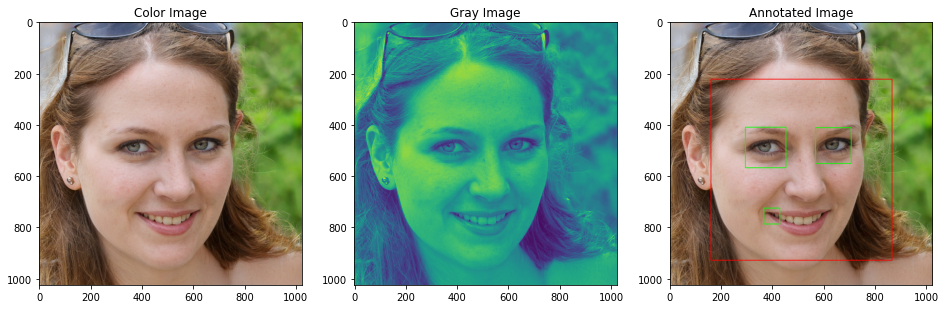

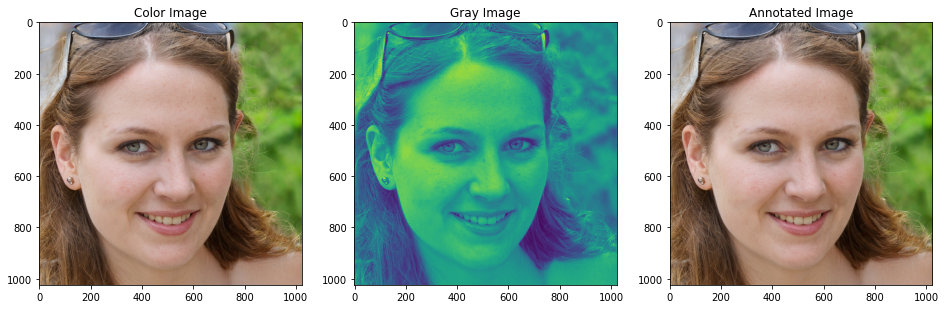

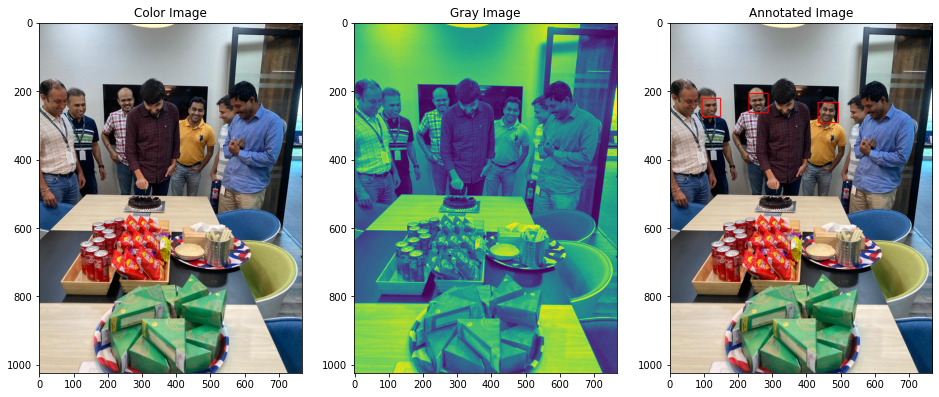

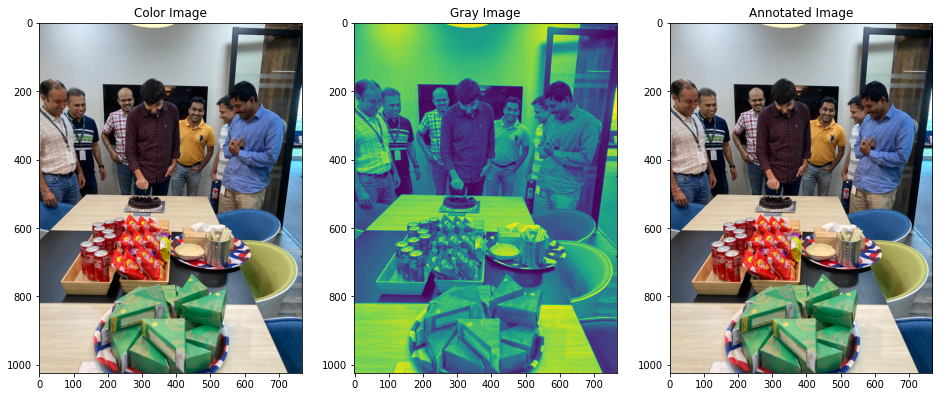

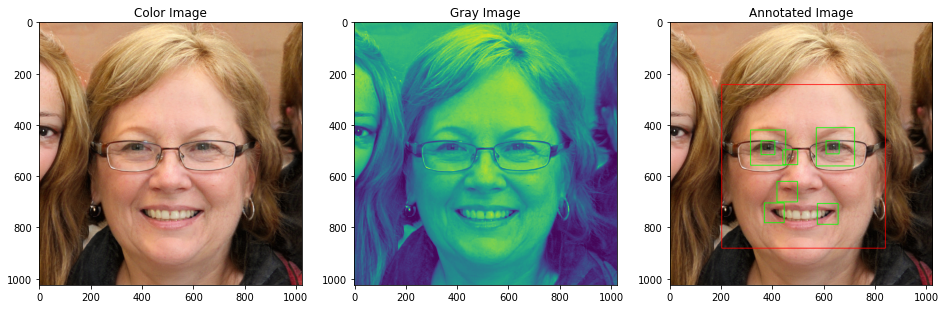

...

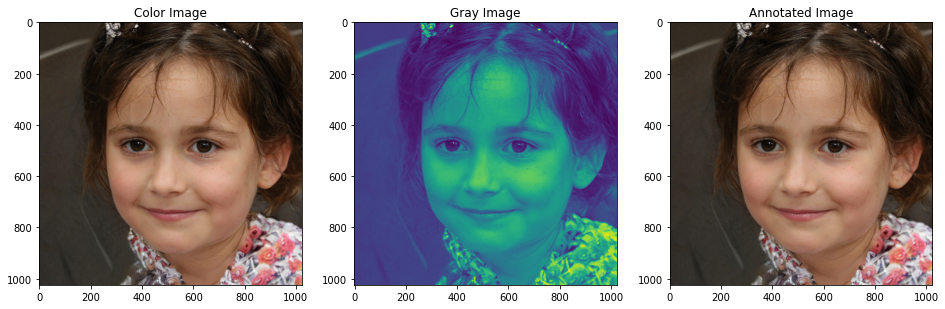

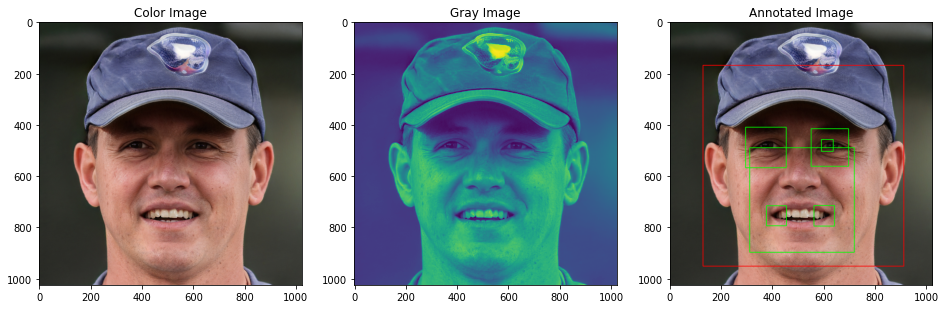

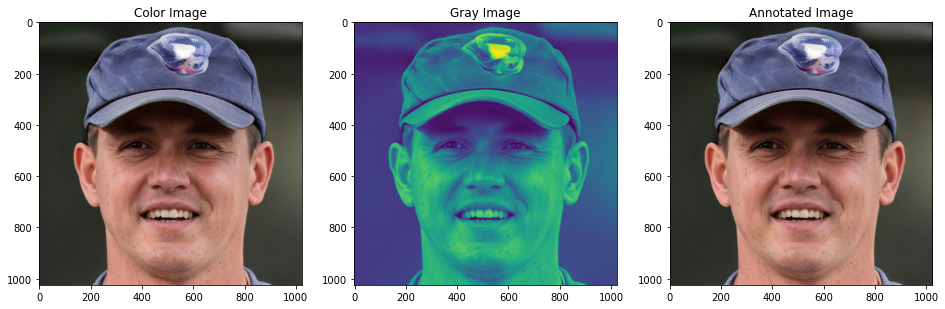

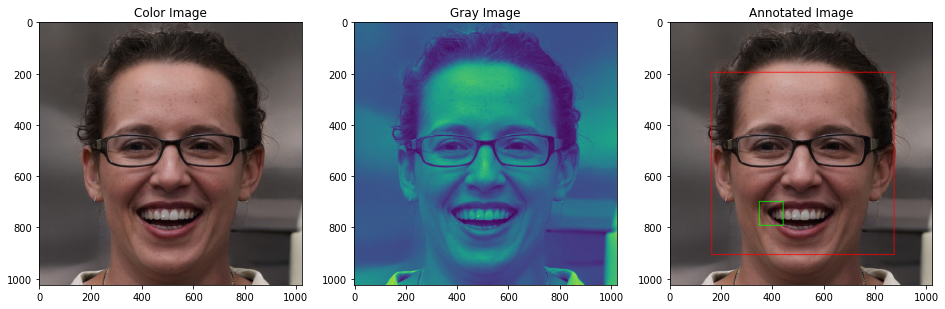

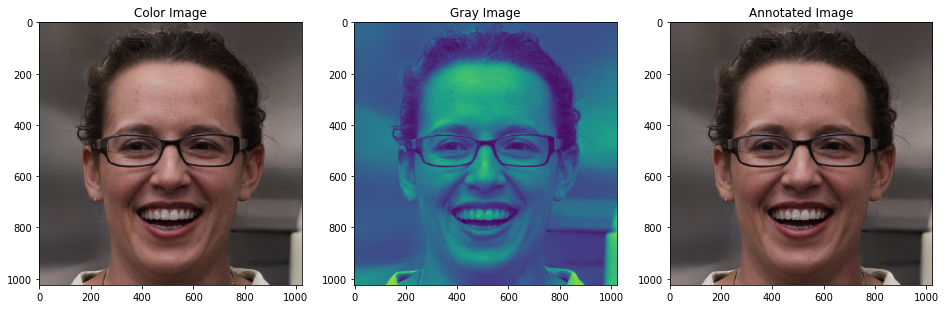

In [8]:
for file_name in pkg_os.listdir(image_dirpath):
    if (file_name.endswith(".jpg")):    
        annotate_face_eyes(file_name, regular_face_classifier_name, regular_eye_classifier_name)
        annotate_face_eyes(file_name, extended_face_classifier_name, eye_glasses_classifier_name)